In [ ]:
### image preprocessing for training test dataset
import cv2
import numpy as np
import os

def preprocess_image(image_path):
    # Load image
    image = cv2.imread(image_path, cv2.IMREAD_COLOR)
    if image is None:
        raise FileNotFoundError(f"Image not found at path {image_path}")

    # Split the image into top and bottom halves
    top_half = image[:512, :, :]
    bottom_half = image[512:1024, :, :]

    # Convert bottom half to grayscale
    gray_bottom = cv2.cvtColor(bottom_half, cv2.COLOR_BGR2GRAY)

    # Apply binary thresholding
    _, thresholded_bottom = cv2.threshold(gray_bottom, 127, 255, cv2.THRESH_BINARY)

    # Combine the top and processed bottom half
    combined_image = np.vstack((top_half, cv2.cvtColor(thresholded_bottom, cv2.COLOR_GRAY2BGR)))

    return combined_image

def process_folder(folder_path, output_folder):
    # Create output folder if it doesn't exist
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    # Process each image in the folder
    for filename in os.listdir(folder_path):
        if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
            file_path = os.path.join(folder_path, filename)
            processed_image = preprocess_image(file_path)

            # Save the processed image
            output_path = os.path.join(output_folder, filename)
            cv2.imwrite(output_path, processed_image)

# Define paths to your datasets
training_dataset_path = 'Training dataset'
test_dataset_path = 'Test dataset'

# Define output paths
training_output_path = 'Processed Training Dataset'
test_output_path = 'Processed Test Dataset'

# Process both datasets
process_folder(training_dataset_path, training_output_path)
process_folder(test_dataset_path, test_output_path)


In [1]:
import tensorflow as tf
import numpy as np
import cv2
import os
import time

from matplotlib import pyplot as plt
from IPython import display

In [2]:
BUFFER_SIZE = 400
BATCH_SIZE = 1
#이미지 크기 설정 
IMG_WIDTH = 512
IMG_HEIGHT = 512

import time
strings = time.strftime("%Y,%m,%d")
t = strings.split(',')
Date = [2024,8,9]
print(Date)

[2024, 8, 9]


In [3]:
# data 저장 경로를 위한 세팅
# 1. network type이 무엇인가
# 2. Date 돌린 시간
# 3. input 파일의 크기
# 4. Loss function 종류
# 5. Train data set 개수

Network = 'UNet'
# Date 위에서 할당함 (YYYY, MM, DD)
# IMG_WIDTH & IMG_HEIGHT
Loss_function = 'SSIM loss'
Trainset_number = 1562
Testset_number = 1
total_epoch = 390

In [4]:
pwd = globals()['_dh'][0]
ROOT_DIR, tail = os.path.split(pwd)

print(pwd)
print(ROOT_DIR)

d:\OneDrive\MBEL\02. Project list\03. Deep learning project\01. Live Cell Imaging\02. Code
d:\OneDrive\MBEL\02. Project list\03. Deep learning project\01. Live Cell Imaging


In [5]:
dir0 = ROOT_DIR
DATASET_DIR = os.path.join(ROOT_DIR, '01. Dataset')
Result_DIR = os.path.join(ROOT_DIR, '03. Learning result')

Prediction_DIR = os.path.join(Result_DIR,'{0}.{1}.{2} {3} {4}x{5} {6} {7} trainset {8} epoch'.format(Date[0], Date[1], Date[2], Network, IMG_WIDTH, IMG_HEIGHT, Loss_function, Trainset_number, total_epoch))
print(Prediction_DIR)
Concat_DIR = os.path.join(Prediction_DIR, '0. Concat_images')
Input_DIR = os.path.join(Prediction_DIR, '1. Input_images')
Groundtruth_DIR = os.path.join(Prediction_DIR, '2. Groundtruth_images')
Pred_DIR = os.path.join(Prediction_DIR, '3. Prediction_images')
Model_DIR = os.path.join(Prediction_DIR, '4. Model')

Split_Concat_DIR = os.path.join(Prediction_DIR, '5. Split_Concat')
Split_BF_DIR = os.path.join(Prediction_DIR, '6. Split_BF')
Split_VS_DIR = os.path.join(Prediction_DIR, '7. Split_VS')
GIF_DIR = os.path.join(Prediction_DIR, '8. GIF')

Prediction = [Concat_DIR, Input_DIR, Groundtruth_DIR, Pred_DIR, Model_DIR, Split_Concat_DIR, Split_BF_DIR,Split_VS_DIR, GIF_DIR]

for i in range(len(Prediction)):
  if not os.path.exists(Prediction[i]):
      os.makedirs(Prediction[i])
      

d:\OneDrive\MBEL\02. Project list\03. Deep learning project\01. Live Cell Imaging\03. Learning result\2024.8.9 UNet 512x512 SSIM loss 1562 trainset 390 epoch


In [6]:
# original code 

def load(image_file):
  image = tf.io.read_file(image_file)
  #image = tf.image.decode_jpeg(image)
  image = tf.image.decode_png(image, channels=3)
    
  h = tf.shape(image)[0]
  h = h // 2
    
  input_image = image[:h, :, :]
  real_image = image[h:, :, :]

  input_image = tf.cast(input_image, tf.float32)
  real_image = tf.cast(real_image, tf.float32)

  return input_image, real_image


def resize(input_image, real_image, height, width):
  input_image = tf.image.resize(input_image, [height, width],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  real_image = tf.image.resize(real_image, [height, width],
                               method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  return input_image, real_image


def random_crop(input_image, real_image):
  stacked_image = tf.stack([input_image, real_image], axis=0)
  cropped_image = tf.image.random_crop(
      stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])

  return cropped_image[0], cropped_image[1]


# normalizing the images to [-1, 1]
def normalize(input_image, real_image):
  input_image = (input_image / 127.5) - 1
  real_image = (real_image / 127.5) - 1

  return input_image, real_image


@tf.function()
def random_jitter(input_image, real_image):
  # resizing to 286 x 286 x 3
  input_image, real_image = resize(input_image, real_image, int(IMG_HEIGHT*1.1), int(IMG_WIDTH*1.1))
  #input_image, real_image = resize(input_image, real_image, IMG_HEIGHT, IMG_WIDTH)

  # randomly cropping to 256 x 256 x 3
  input_image, real_image = random_crop(input_image, real_image)

  if tf.random.uniform(()) > 0.5:
    # random mirroring
    input_image = tf.image.flip_left_right(input_image)
    real_image = tf.image.flip_left_right(real_image)

  return input_image, real_image


def load_image_train(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = random_jitter(input_image, real_image)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image


def load_image_test(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = resize(input_image, real_image,
                                   IMG_HEIGHT, IMG_WIDTH)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image



## 입력 파이프라인

In [7]:
train_dir = os.path.join(DATASET_DIR,'Training 240809')
train_path = os.path.join(train_dir, '*.png')

test_dir = os.path.join(DATASET_DIR,'Test 240809')
test_path = os.path.join(test_dir, '*.png')

valid_dir = os.path.join(DATASET_DIR,'Valid dataset')
valid_path = os.path.join(valid_dir, '*.png')

In [8]:
train_dataset = tf.data.Dataset.list_files(train_path)
train_dataset = train_dataset.map(load_image_train,
                                  num_parallel_calls=tf.data.experimental.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

test_dataset = tf.data.Dataset.list_files(test_path, shuffle=False)
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)

valid_dataset = tf.data.Dataset.list_files(valid_path, shuffle=False)
valid_dataset = valid_dataset.map(load_image_test)
valid_dataset = valid_dataset.batch(BATCH_SIZE)

##테스트 이미지

>> check


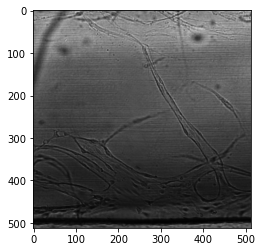

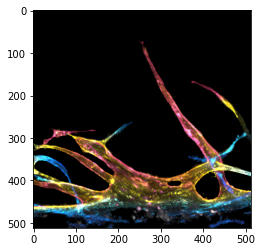

In [9]:
sample_path = os.path.join(train_dir, '11-6-0-512_r.png')

inp, re = load(sample_path)
# casting to int for matplotlib to show the image

print('>> check')

plt.figure()
plt.imshow(inp/255.0)
plt.figure()
plt.imshow(re/255.0)

---
## 생성기 빌드하기

* 생성기 아키텍처는 수정된 U-Net입니다.
* 인코더의 각 블록은 (Conv -> Batchnorm -> Leaky ReLU)입니다.
* 디코더의 각 블록은 (Transposed Conv -> Batchnorm -> Dropout(처음 3개의 블록에 * 적용됨)-> ReLU)입니다.
* 인코더와 디코더 사이에는 스킵(skip) 연결이 있습니다(U-Net에서와 같이).

## Unet Generator

In [10]:
""" 24.05.14 기준 정상 코드 / 저장 문제 해결 버전"""
import tensorflow as tf

# Define a custom Layer for the Residual Block
class ResidualBlock(tf.keras.layers.Layer):
    def __init__(self, filters, size, apply_batchnorm=True, strides=1, **kwargs):
        super(ResidualBlock, self).__init__(**kwargs)
        self.filters = filters
        self.size = size
        self.apply_batchnorm = apply_batchnorm
        self.strides = strides
        initializer = tf.random_normal_initializer(0., 0.02)

        self.conv1 = tf.keras.layers.Conv2D(filters, size, strides=strides, padding='same',
                                            kernel_initializer=initializer, use_bias=False)
        if self.apply_batchnorm:
            self.batchnorm1 = tf.keras.layers.BatchNormalization()

        self.relu1 = tf.keras.layers.ReLU()

        self.conv2 = tf.keras.layers.Conv2D(filters, size, strides=strides, padding='same',
                                            kernel_initializer=initializer, use_bias=False)
        if self.apply_batchnorm:
            self.batchnorm2 = tf.keras.layers.BatchNormalization()

        self.add = tf.keras.layers.Add()
        self.relu2 = tf.keras.layers.ReLU()

    def call(self, inputs, **kwargs):
        x = self.conv1(inputs)
        if self.apply_batchnorm:
            x = self.batchnorm1(x)
        x = self.relu1(x)
        x = self.conv2(x)
        if self.apply_batchnorm:
            x = self.batchnorm2(x)
        x = self.add([inputs, x])
        x = self.relu2(x)
        return x

    def get_config(self):
        config = super(ResidualBlock, self).get_config()
        config.update({
            "filters": self.filters,
            "size": self.size,
            "apply_batchnorm": self.apply_batchnorm,
            "strides": self.strides
        })
        return config

    @classmethod
    def from_config(cls, config):
        return cls(**config)

# Update the downsample and upsample functions to include the custom ResidualBlock
def downsample(filters, size, apply_batchnorm=True, include_residual=False):
    result = tf.keras.Sequential()
    initializer = tf.random_normal_initializer(0., 0.02)
    result.add(tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                                      kernel_initializer=initializer, use_bias=False))

    if apply_batchnorm:
        result.add(tf.keras.layers.BatchNormalization())
    result.add(tf.keras.layers.LeakyReLU())

    if include_residual:
        result.add(ResidualBlock(filters, size, apply_batchnorm))

    return result

def upsample(filters, size, apply_dropout=False, include_residual=False):
    result = tf.keras.Sequential()
    initializer = tf.random_normal_initializer(0., 0.02)
    result.add(tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                               padding='same',
                                               kernel_initializer=initializer,
                                               use_bias=False))
    result.add(tf.keras.layers.BatchNormalization())

    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))
    result.add(tf.keras.layers.ReLU())

    if include_residual:
        result.add(ResidualBlock(filters, size))

    return result

# Define the Generator as before
def Generator():
    inputs = tf.keras.layers.Input(shape=[None, None, 3])
    down_stack = [
        downsample(64, 4, apply_batchnorm=False),  # No BN or residuals on first layer
        downsample(128, 4, include_residual=True),
        downsample(256, 4, include_residual=True),
        downsample(512, 4, include_residual=True),
        downsample(512, 4, include_residual=True),
        downsample(512, 4, include_residual=True),
        downsample(512, 4, include_residual=True),
        downsample(512, 4, include_residual=True),
    ]

    up_stack = [
        upsample(512, 4, apply_dropout=True, include_residual=True),
        upsample(512, 4, apply_dropout=True, include_residual=True),
        upsample(512, 4, apply_dropout=True, include_residual=True),
        upsample(512, 4, include_residual=True),
        upsample(256, 4, include_residual=True),
        upsample(128, 4, include_residual=True),
        upsample(64, 4, include_residual=True),
    ]

    last = tf.keras.layers.Conv2DTranspose(3, 4, strides=2, padding='same',
                                           kernel_initializer=tf.random_normal_initializer(0., 0.02),
                                           activation='tanh')  # Final layer

    x = inputs
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = tf.keras.layers.Concatenate()([x, skip])

    x = last(x)

    return tf.keras.Model(inputs=inputs, outputs=x)

# Instantiate and summarize the generator
generator = Generator()
generator.summary()


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 sequential (Sequential)        (None, None, None,   3072        ['input_1[0][0]']                
                                64)                                                               
                                                                                                  
 sequential_1 (Sequential)      (None, None, None,   656896      ['sequential[0][0]']             
                                128)                                                          

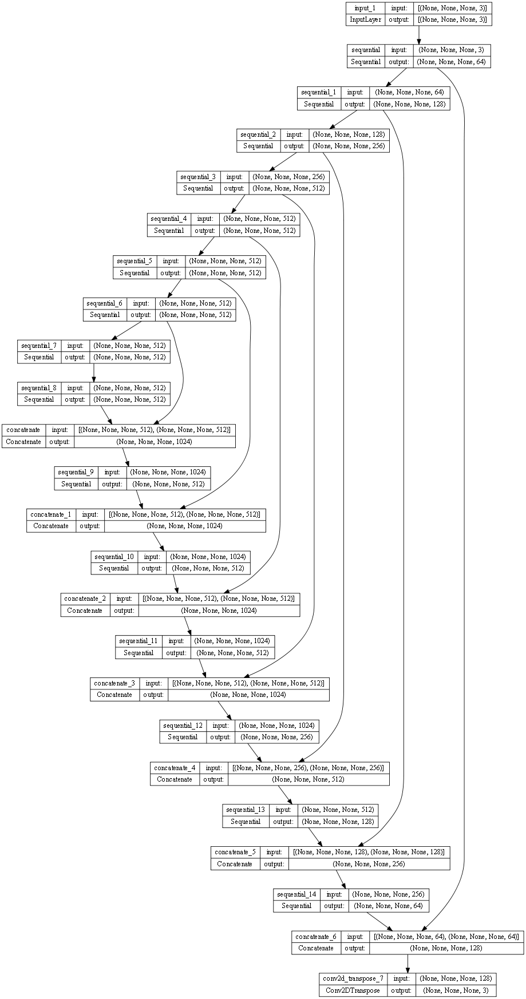

In [11]:
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

---
### 생성기 손실
* 이것은 생성된 이미지 및 1의 배열의 시그모이드 교차 엔트로피 손실입니다.
* 논문에는 생성 이미지와 대상 이미지 사이의 MAE(평균 절대 오차)인 L1 손실도 포함됩니다.
* 이를 통해 생성된 이미지가 대상 이미지와 구조적으로 유사해질 수 있습니다.
* 총 생성기 손실을 계산하는 공식 = gan_loss + LAMBDA * l1_loss. 여기서 LAMBDA = 100. 이 값은 논문 작성자가 결정했습니다.

생성기의 훈련 절차는 다음과 같습니다.

In [12]:
LAMBDA = 100

def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # mean absolute error
  # l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
  # l2_loss = tf.reduce_mean(tf.square(target - gen_output)) # l2 loss
  SSIM_loss = 1 - tf.reduce_mean(tf.image.ssim(target, gen_output, max_val = 2.0))
  # MSSSIM_loss = 1 - tf.reduce_mean(tf.image.ssim_multiscale(target, gen_output, max_val=2.0, filter_size=11, filter_sigma=1.5, k1=0.01, k2=0.030))
  total_gen_loss = gan_loss + (LAMBDA * SSIM_loss)

  return total_gen_loss, gan_loss, SSIM_loss

---
### 생성기 테스트

In [13]:
down_model = downsample(3, 4)
print('>> check 1')
down_result = down_model(tf.expand_dims(inp, 0))
print (down_result.shape)

>> check 1
(1, 256, 256, 3)


In [14]:

up_model = upsample(3, 4)
up_result = up_model(down_result)
print (up_result.shape)


(1, 512, 512, 3)


In [15]:
print(inp.shape)

(512, 512, 3)


In [16]:
generator(inp[tf.newaxis,...])

<tf.Tensor: shape=(1, 512, 512, 3), dtype=float32, numpy=
array([[[[-0.85131186, -0.9681787 , -0.9954369 ],
         [ 0.9998805 , -0.13367014,  0.8981945 ],
         [-0.9724455 ,  0.2954712 , -0.92129207],
         ...,
         [ 0.99541634, -0.9832907 ,  0.9931561 ],
         [-0.8769957 ,  0.86174554, -0.9594003 ],
         [-0.7031878 , -0.01639094,  0.92462844]],

        [[ 0.99992967, -0.98083866, -0.8596484 ],
         [ 0.9681052 , -0.99994695, -0.9681271 ],
         [ 0.985872  , -0.9991236 , -0.8350268 ],
         ...,
         [ 0.97858775, -0.9999455 , -0.9605105 ],
         [ 0.9932531 , -0.99811155,  0.27920756],
         [-0.3910626 , -0.9998889 ,  0.10930959]],

        [[-0.62095326, -0.90559244, -0.99971354],
         [ 1.        ,  0.8500165 , -0.98950106],
         [-0.9999929 ,  0.6678632 , -0.9126518 ],
         ...,
         [ 0.99999774, -0.9455421 ,  0.5049366 ],
         [-0.99956805,  0.99945915, -0.95100045],
         [-0.90824264,  0.4038095 ,  0.9976022

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


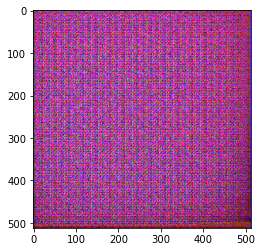

In [17]:
gen_output = generator(inp[tf.newaxis,...], training=False)
plt.imshow(gen_output[0,...])

---
## 판별자 빌드하기

* 판별자는 PatchGAN입니다.
* 판별자의 각 블록은 (Conv -> BatchNorm -> Leaky ReLU)입니다.
* 마지막 레이어 이후의 출력 형상은 (batch_size, 30, 30, 1)입니다.
* 출력의 각 30x30 패치는 입력 이미지의 70x70 부분을 분류합니다(이러한 아키텍처를 PatchGAN이라고 함).
* 판별자는 2개의 입력을 받습니다.
> * 진짜로 분류해야 하는 입력 이미지 및 대상 이미지
> * 가짜로 분류해야 하는 입력 이미지 및 생성된 이미지(생성기의 출력)
> * 코드에서 이 두 입력을 함께 연결합니다(tf.concat([inp, tar], axis=-1)).

In [18]:
"""24.05.14 저장 문제 해결 버전"""
class DiscriminatorResidualBlock(tf.keras.layers.Layer):
    def __init__(self, filters, size, strides=1, apply_batchnorm=True):
        super(DiscriminatorResidualBlock, self).__init__()
        self.filters = filters  # Ensuring filters are initialized
        self.size = size        # Ensuring size is initialized
        self.strides = strides  # Ensuring strides are initialized
        self.apply_batchnorm = apply_batchnorm
        initializer = tf.random_normal_initializer(0., 0.02)

        self.conv1 = tf.keras.layers.Conv2D(filters, size, strides=strides, padding='same',
                                            kernel_initializer=initializer, use_bias=False)
        if self.apply_batchnorm:
            self.batchnorm1 = tf.keras.layers.BatchNormalization()

        self.leaky_relu = tf.keras.layers.LeakyReLU()

        self.conv2 = tf.keras.layers.Conv2D(filters, size, strides=strides, padding='same',
                                            kernel_initializer=initializer, use_bias=False)
        if self.apply_batchnorm:
            self.batchnorm2 = tf.keras.layers.BatchNormalization()

        # 1x1 convolution to adjust the input channel size
        self.match_channels = tf.keras.layers.Conv2D(filters, 1, strides=1, padding='same',
                                                     kernel_initializer=initializer, use_bias=False)
        self.add = tf.keras.layers.Add()

    def call(self, inputs):
        x = self.conv1(inputs)
        if self.apply_batchnorm:
            x = self.batchnorm1(x)
        x = self.leaky_relu(x)
        x = self.conv2(x)
        if self.apply_batchnorm:
            x = self.batchnorm2(x)
        # Adjust the input tensor channel size
        inputs = self.match_channels(inputs)
        x = self.add([inputs, x])
        x = self.leaky_relu(x)
        return x

    def get_config(self):
        config = super(DiscriminatorResidualBlock, self).get_config()
        config.update({
            "filters": self.filters,
            "size": self.size,
            "strides": self.strides,
            "apply_batchnorm": self.apply_batchnorm
        })
        return config
def Discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)
    inp = tf.keras.layers.Input(shape=[IMG_HEIGHT, IMG_WIDTH, 3], name='input_image')
    tar = tf.keras.layers.Input(shape=[IMG_HEIGHT, IMG_WIDTH, 3], name='target_image')

    x = tf.keras.layers.concatenate([inp, tar])

    x = downsample(64, 4, False)(x)
    x = DiscriminatorResidualBlock(128, 4)(x)
    x = DiscriminatorResidualBlock(256, 4)(x)

    x = tf.keras.layers.ZeroPadding2D()(x)
    x = tf.keras.layers.Conv2D(512, 4, strides=1, kernel_initializer=initializer, use_bias=False)(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.LeakyReLU()(x)

    x = tf.keras.layers.ZeroPadding2D()(x)
    x = tf.keras.layers.Conv2D(1, 4, strides=1, kernel_initializer=initializer)(x)

    return tf.keras.Model(inputs=[inp, tar], outputs=x)

# Instantiate the Discriminator model
discriminator = Discriminator()

# Optionally, print the model summary to verify its architecture
discriminator.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_image (InputLayer)       [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 target_image (InputLayer)      [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 concatenate_7 (Concatenate)    (None, 512, 512, 6)  0           ['input_image[0][0]',            
                                                                  'target_image[0][0]']     

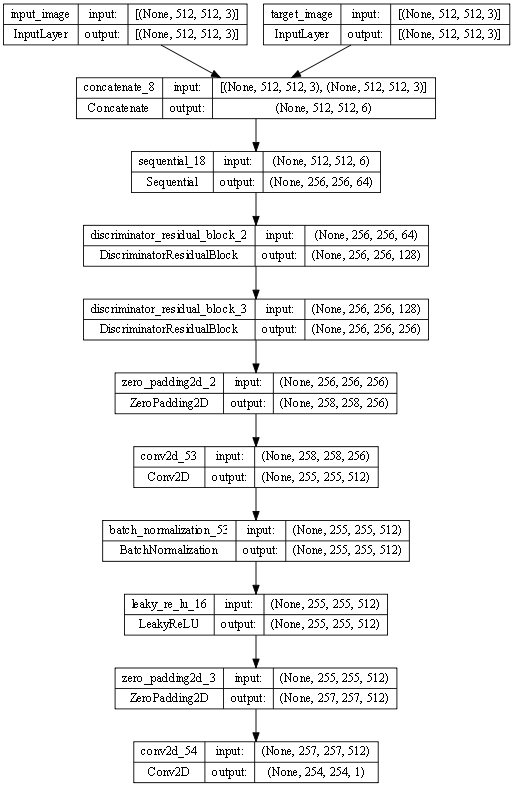

In [19]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

---
## 판별자 손실

* 판별자 손실 함수는 진짜 이미지, 생성된 이미지의 두 입력을 받습니다.
* real_loss는 진짜 이미지 및 1의 배열(진짜 이미지이기 때문)의 시그모이드 교차 엔트로피 손실입니다.
* generated_loss는 생성된 이미지 및 0의 배열(가짜 이미지이기 때문)의 시그모이드 교차 엔트로피 손실입니다.
* 그리고 total_loss는 real_loss와 generated_loss의 합계입니다.

In [20]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

---
### 판별자 테스트

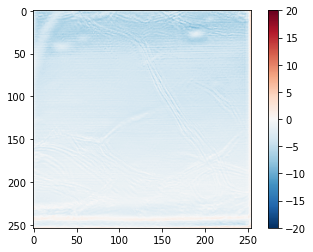

In [21]:
disc_out = discriminator([inp[tf.newaxis,...], gen_output], training=False)
plt.imshow(disc_out[0,...,-1], vmin=-20, vmax=20, cmap='RdBu_r')
plt.colorbar()

---
## 옵티마이저 및 체크포인트-세이버 정의하기

In [22]:
USE_CHECKPOINT = False
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
if USE_CHECKPOINT == True:
    checkpoint_dir = './training_checkpoints'
    checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
    checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                     discriminator_optimizer=discriminator_optimizer,
                                     generator=generator,
                                     discriminator=discriminator)


---
## 이미지 생성하기
훈련 중에 일부 이미지를 플롯하는 함수를 작성합니다.

* 테스트 데이터세트의 이미지를 생성기로 전달합니다.
* 그러면 생성기가 입력 이미지를 출력으로 변환합니다.
* 마지막 단계로 예상을 플롯합니다. 짜잔!

참고: 여기서 training=True는 테스트 데이터세트에서 모델을 실행하는 동안 배치 통계를 얻으려고 하므로 의도적인 것입니다. training = False를 사용하면 훈련 데이터세트에서 학습한 누적 통계(이것을 원하지는 않음)를 얻게 됩니다.

In [23]:
def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(10,10))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
    prediction_name = '{}/{}/{}.png'.format(DATASET_DIR,'Prediction_images', i)
    prediction_image = np.array((display_list[i] * 0.5 + 0.5)*255.0, dtype=np.uint8)
    cv2.imwrite(prediction_name, prediction_image)
  plt.show()

In [24]:
def save_images(model, test_input, tar, order):
    prediction = model(test_input, training=False)
    plt.figure(figsize=(10,10))
    
    title = ['Input Image', 'Ground Truth', 'Predicted Image']
    for index in range(BATCH_SIZE):
        display_list = [test_input[index], tar[index], prediction[index]]
        concat = [[],[],[]]
        for i in range(3):
            display_list[i] = np.array((display_list[i]*0.5+0.5)*255.0)
            plt.subplot(1, 3, i+1)
            plt.title(title[i])
            # getting the pixel values between [0, 1] to plot it.
            plt.imshow(display_list[i] * 0.5 + 0.5)
            plt.axis('off')
            
            
            
            if i == 2:
                prediction_name = '{}/{}/{}.png'.format(DATASET_DIR,'Prediction_images', order*BATCH_SIZE+index)
                prediction_image = np.array(display_list[i], dtype=np.uint8)
                cv2.imwrite(prediction_name, prediction[index])
        plt.show()
        
        
        

---
### 이미지 생성 테스트

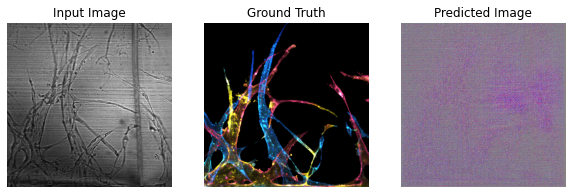

In [25]:
for example_input, example_target in test_dataset.take(1):
  generate_images(generator, example_input, example_target)


---
## 훈련하기

* 각 예에서 입력은 출력을 생성합니다.
* 판별자는 input_image 및 생성된 이미지를 첫 번째 입력으로 받습니다. 두 번째 * 입력은 input_image와 target_image입니다.
* 다음으로 생성기와 판별자 손실을 계산합니다.
* 그런 다음 생성기와 판별자 변수(입력) 모두에 대해 손실의 그래디언트를 계산하고 이를 옵티마이저에 적용합니다.
* 그런 다음 손실을 TensorBoard에 기록합니다.

In [26]:
@tf.function
def train_step(input_image, target, epoch):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)

    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))
    
  return gen_total_loss, gen_gan_loss, gen_l1_loss, disc_loss

'''
  with summary_writer.as_default():
    tf.summary.scalar('gen_total_loss', gen_total_loss, step=epoch)
    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=epoch)
    tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=epoch)
    tf.summary.scalar('disc_loss', disc_loss, step=epoch)
'''
    

"\n  with summary_writer.as_default():\n    tf.summary.scalar('gen_total_loss', gen_total_loss, step=epoch)\n    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=epoch)\n    tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=epoch)\n    tf.summary.scalar('disc_loss', disc_loss, step=epoch)\n"

실제 훈련 루프:

* epoch 수에 대해 반복합니다.
* 각 epoch에서 표시 내용을 지우고 generate_images를 실행하여 진행 상황을 * 표시합니다.
* 각 epoch마다 훈련 데이터세트에 대해 반복하여 각 예에 대해 '.'를 인쇄합니다.
* 20개 epoch마다 체크포인트를 저장합니다.

In [27]:
def fit(train_ds, epochs, test_ds):
  p2p_loss = {'gen_total_loss':[], 'gen_gan_loss':[], 'gen_l1_loss':[], 'disc_loss':[]}
    
  for epoch in range(epochs):
    start = time.time()

    # display.clear_output(wait=True)

    for example_input, example_target in test_ds.take(1):
      generate_images(generator, example_input, example_target)
    print("Epoch: ", epoch+1)

    gen_total_loss, gen_gan_loss, gen_l1_loss, disc_loss = 0, 0, 0, 0
    train_count = 0
    
    # Train
    for n, (input_image, target) in train_ds.enumerate():
      print('.', end='')
      if (n+1) % 100 == 0:
        print()
        
      g_total_loss, g_gan_loss, g_l1_loss, d_loss = train_step(input_image, target, epoch)
    
      gen_total_loss += g_total_loss
      gen_gan_loss += g_gan_loss
      gen_l1_loss += g_l1_loss
      disc_loss += d_loss
      
      train_count += 1

    p2p_loss['gen_total_loss'].append(gen_total_loss/train_count)
    p2p_loss['gen_gan_loss'].append(gen_gan_loss/train_count)
    p2p_loss['gen_l1_loss'].append(gen_l1_loss/train_count)
    p2p_loss['disc_loss'].append(disc_loss/train_count)
    
    print()

    # saving (checkpoint) the model every 20 epochs
    if USE_CHECKPOINT == True:
        if (epoch + 1) % 20 == 0:
          checkpoint.save(file_prefix = checkpoint_prefix)

    print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,
                                                        time.time()-start))
    print('Loss : ',gen_total_loss/train_count)
  if USE_CHECKPOINT == True:
      checkpoint.save(file_prefix = checkpoint_prefix)

  return p2p_loss

---
## Save Models

In [28]:
model_gen_file = os.path.join(Model_DIR, 'angio_p2p_model_gen.json')
model_dis_file = os.path.join(Model_DIR, 'angio_p2p_model_dis.json')

In [29]:
gen_json = generator.to_json()
dis_json = discriminator.to_json()

with open(model_gen_file, 'w') as fd:
    fd.write(gen_json)

with open(model_dis_file, 'w') as fd:
    fd.write(dis_json)

In [30]:
from keras.models import model_from_json 

def load_model(json_filename):
    json_file = open(json_filename, "r")
    loaded_model_json = json_file.read() 
    json_file.close()
    
    model = model_from_json(loaded_model_json)
    return model


In [31]:
generator = Generator()
discriminator = Discriminator()

---
## Save weights

In [32]:
def save_weight(epoch):
    weights_gen_file = os.path.join(Model_DIR, 'angio_p2p_gen_epoch_{}.h5'.format(epoch))
    weights_dis_file = os.path.join(Model_DIR, 'angio_p2p_dis_epoch_{}.h5'.format(epoch))

    generator.save_weights(weights_gen_file)
    discriminator.save_weights(weights_dis_file)    

    
def load_weight(epoch):
    weights_gen_file = os.path.join(Model_DIR, 'angio_p2p_gen_epoch_{}.h5'.format(epoch))
    weights_dis_file = os.path.join(Model_DIR, 'angio_p2p_dis_epoch_{}.h5'.format(epoch))

    generator.load_weights(weights_gen_file)
    discriminator.load_weights(weights_dis_file)        

---
## Training

In [33]:
curr_epoch = 0

EPOCHS = 20

>> curr_epoch = 0


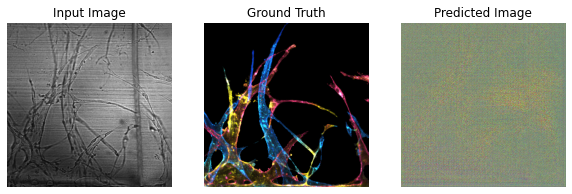

Epoch:  1
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.................................................................................

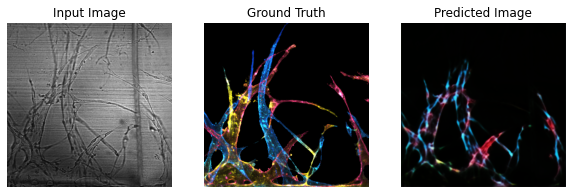

Epoch:  2
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.................................................................................

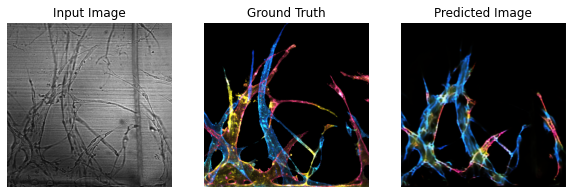

Epoch:  3
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.................................................................................

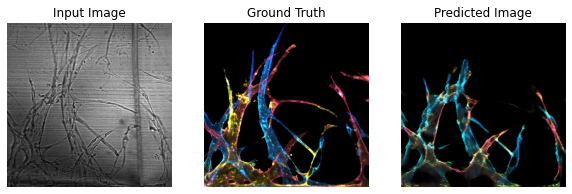

Epoch:  4
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.................................................................................

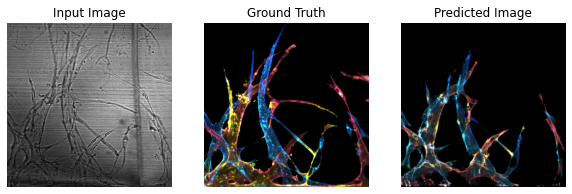

Epoch:  5
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.................................................................................

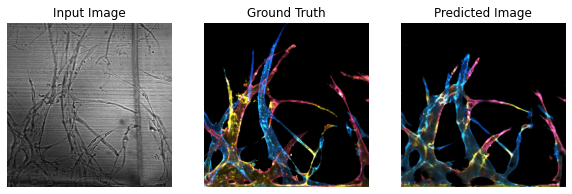

Epoch:  6
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.................................................................................

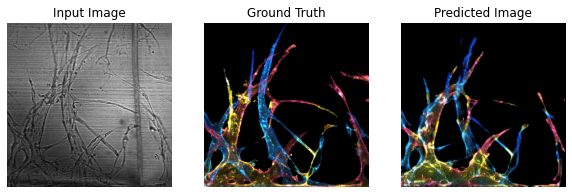

Epoch:  7
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.................................................................................

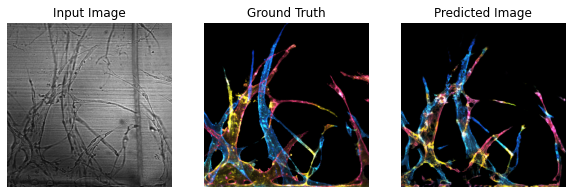

Epoch:  8
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.................................................................................

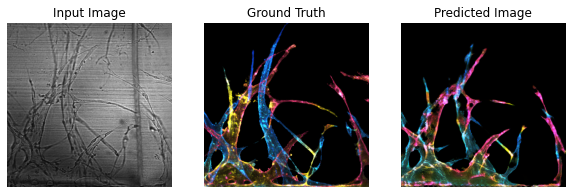

Epoch:  9
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.................................................................................

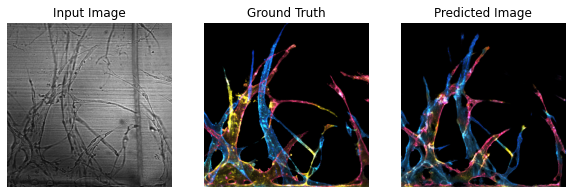

Epoch:  10
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

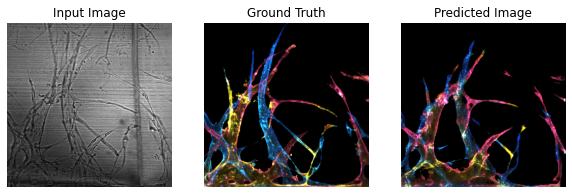

Epoch:  11
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

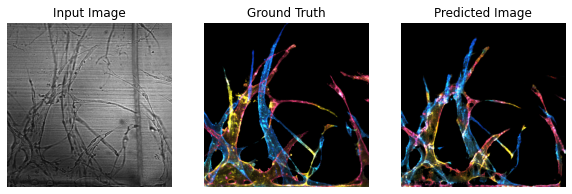

Epoch:  12
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

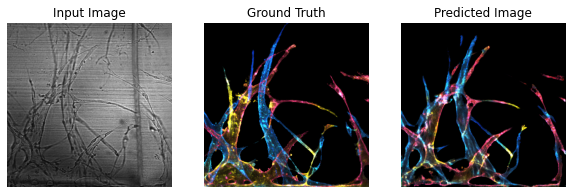

Epoch:  13
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

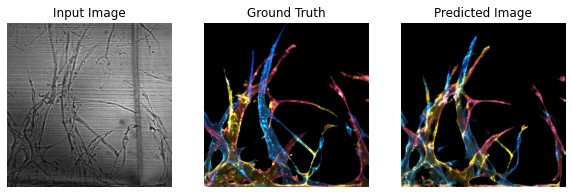

Epoch:  14
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

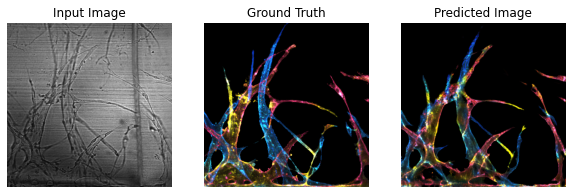

Epoch:  15
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

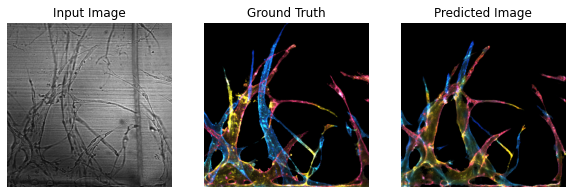

Epoch:  16
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

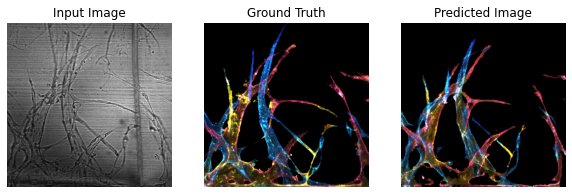

Epoch:  17
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

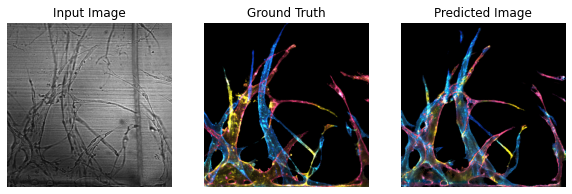

Epoch:  18
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

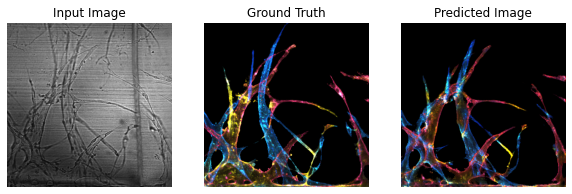

Epoch:  19
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

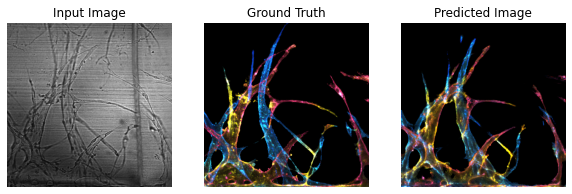

Epoch:  20
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

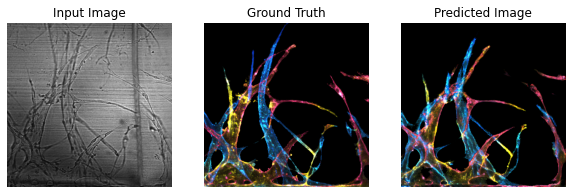

Epoch:  1
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.................................................................................

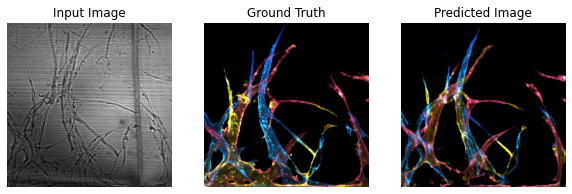

Epoch:  2
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.................................................................................

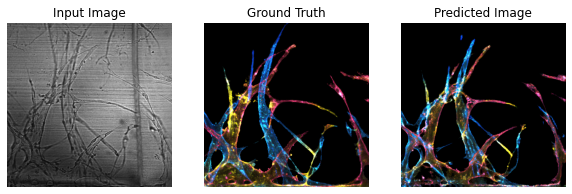

Epoch:  3
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.................................................................................

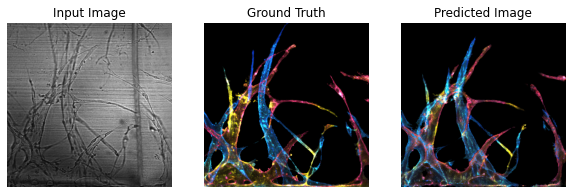

Epoch:  4
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.................................................................................

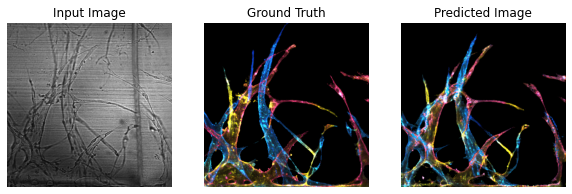

Epoch:  5
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.................................................................................

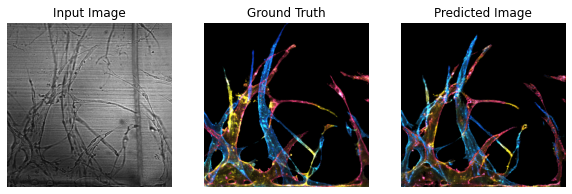

Epoch:  6
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.................................................................................

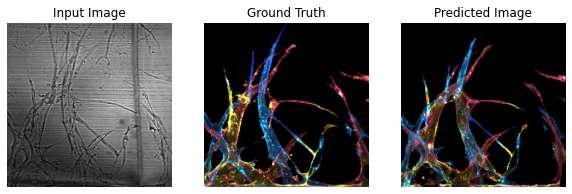

Epoch:  7
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.................................................................................

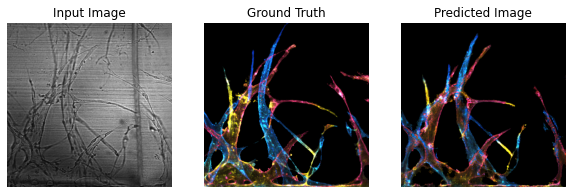

Epoch:  8
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.................................................................................

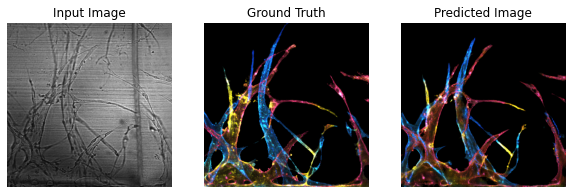

Epoch:  9
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.................................................................................

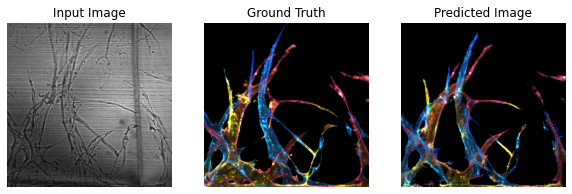

Epoch:  10
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

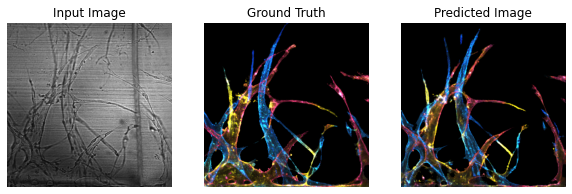

Epoch:  11
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

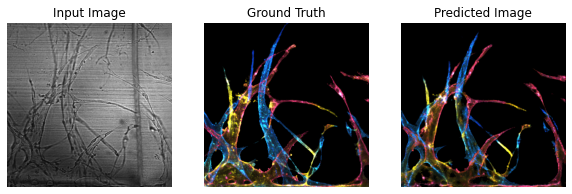

Epoch:  12
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

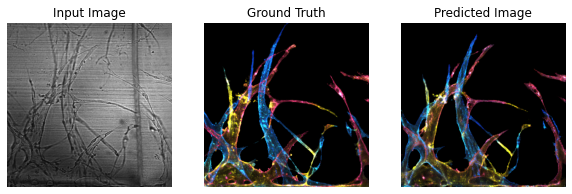

Epoch:  13
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

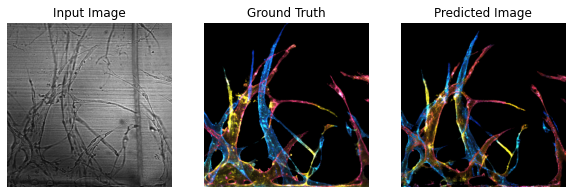

Epoch:  14
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

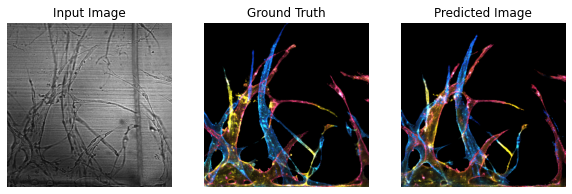

Epoch:  15
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

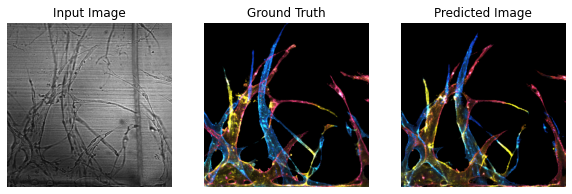

Epoch:  16
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

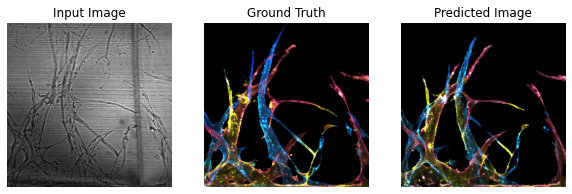

Epoch:  17
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

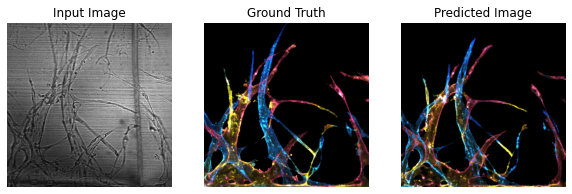

Epoch:  18
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

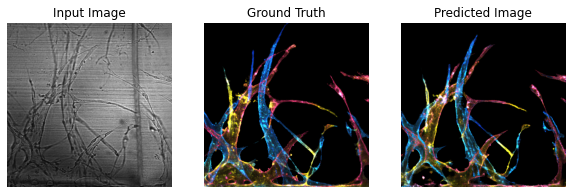

Epoch:  19
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

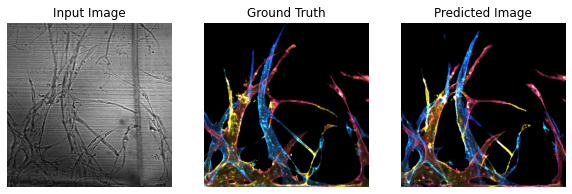

Epoch:  20
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

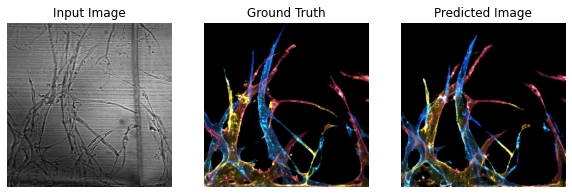

Epoch:  1
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.................................................................................

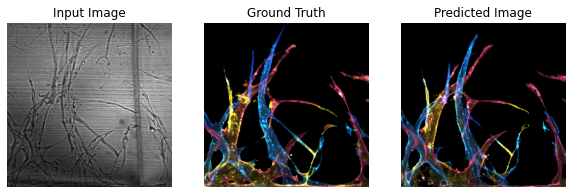

Epoch:  2
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.................................................................................

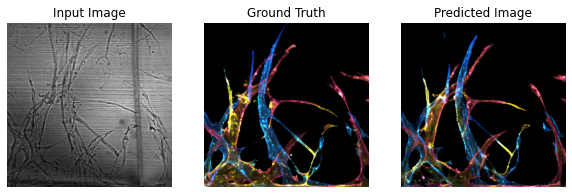

Epoch:  3
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.................................................................................

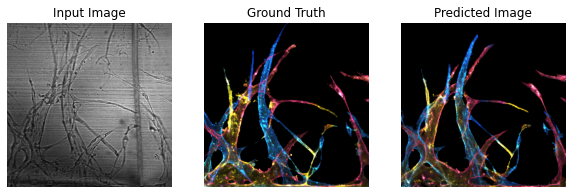

Epoch:  4
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.................................................................................

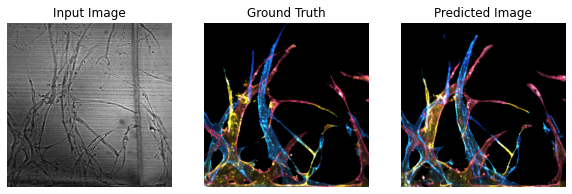

Epoch:  5
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.................................................................................

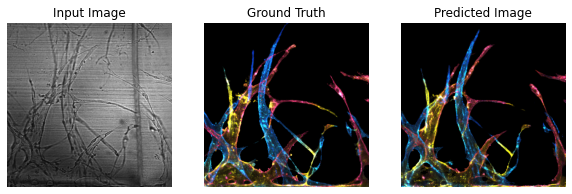

Epoch:  6
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.................................................................................

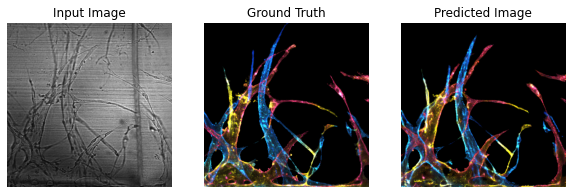

Epoch:  7
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.................................................................................

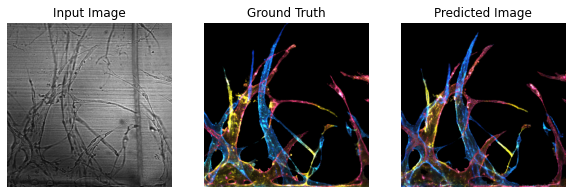

Epoch:  8
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.................................................................................

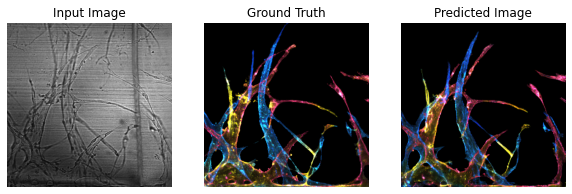

Epoch:  9
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.................................................................................

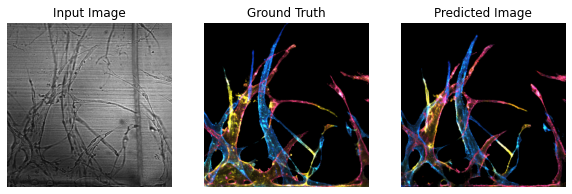

Epoch:  10
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

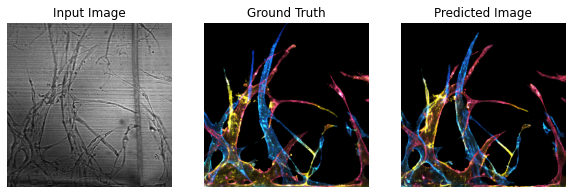

Epoch:  11
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

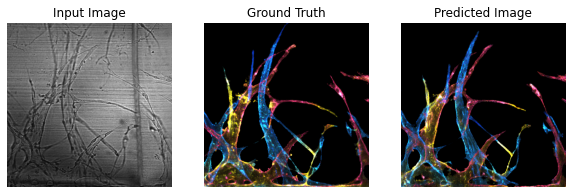

Epoch:  12
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

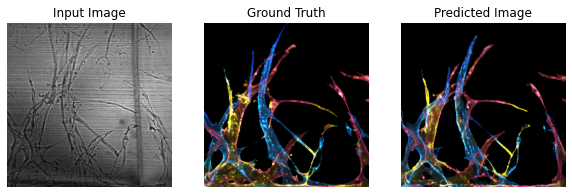

Epoch:  13
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

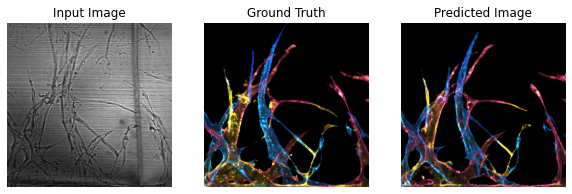

Epoch:  14
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

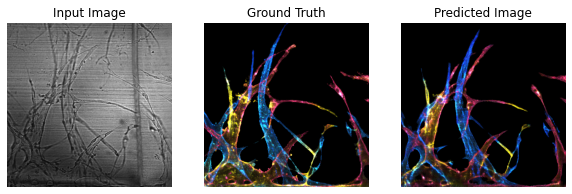

Epoch:  15
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

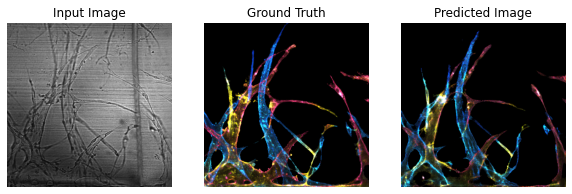

Epoch:  16
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

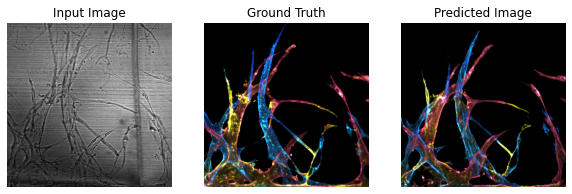

Epoch:  17
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

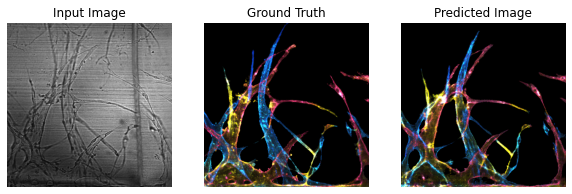

Epoch:  18
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

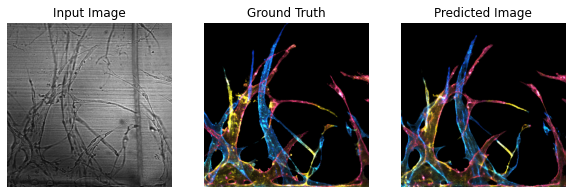

Epoch:  19
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

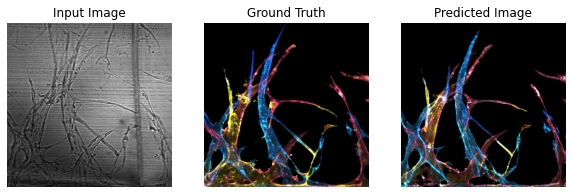

Epoch:  20
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

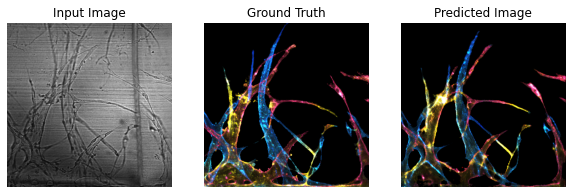

Epoch:  1
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.................................................................................

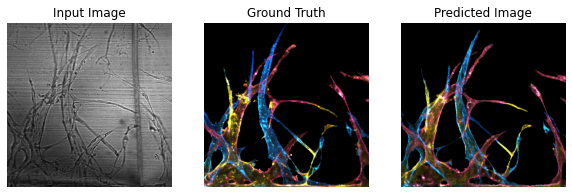

Epoch:  2
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.................................................................................

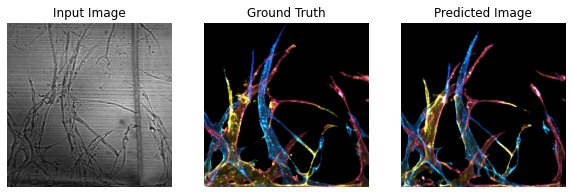

Epoch:  3
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.................................................................................

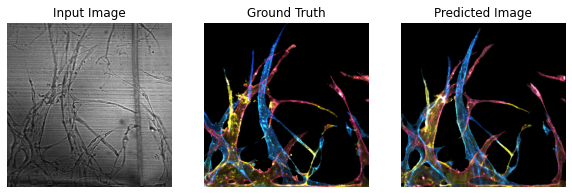

Epoch:  4
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.................................................................................

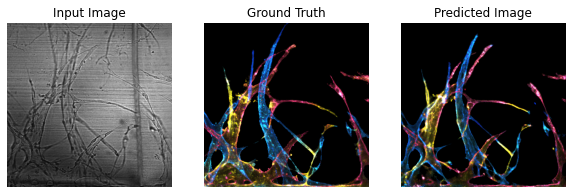

Epoch:  5
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.................................................................................

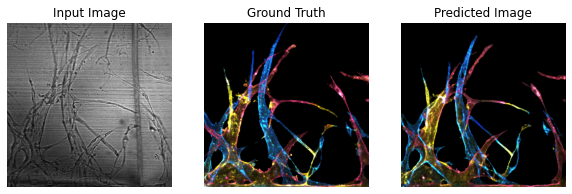

Epoch:  6
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.................................................................................

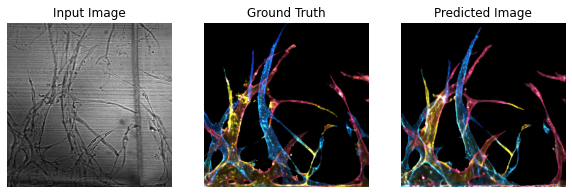

Epoch:  7
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.................................................................................

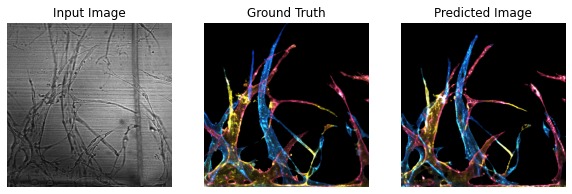

Epoch:  8
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.................................................................................

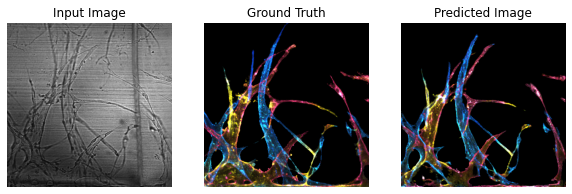

Epoch:  9
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.................................................................................

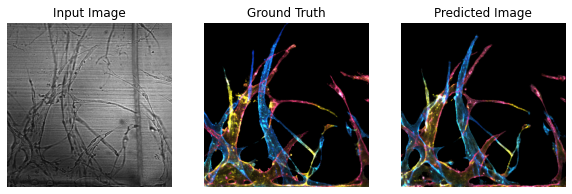

Epoch:  10
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

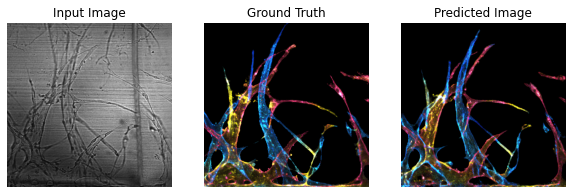

Epoch:  11
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

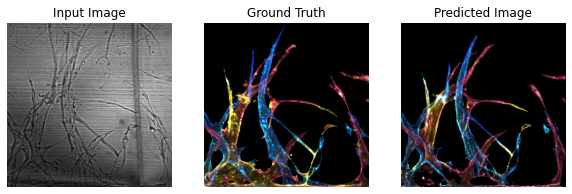

Epoch:  12
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

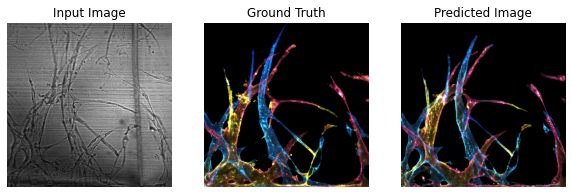

Epoch:  13
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

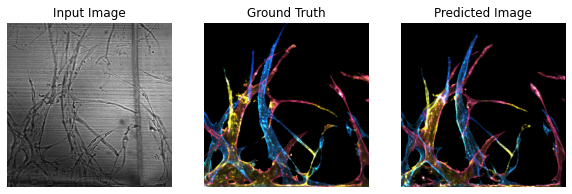

Epoch:  14
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

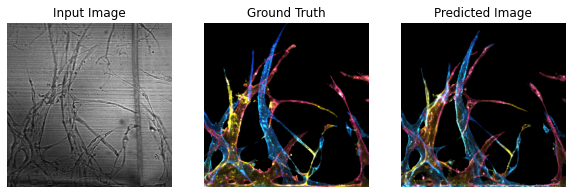

Epoch:  15
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

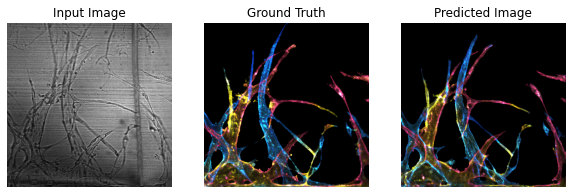

Epoch:  16
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

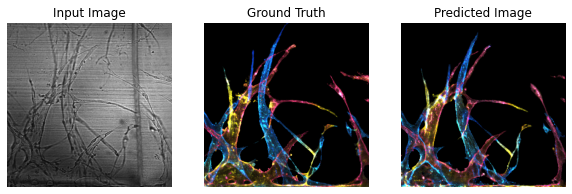

Epoch:  17
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

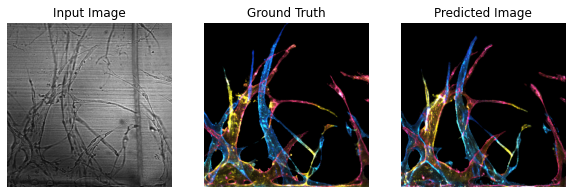

Epoch:  18
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

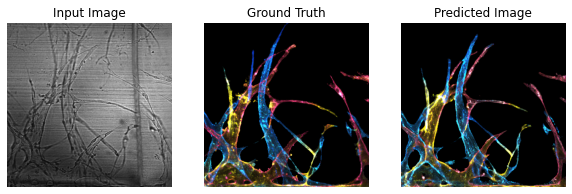

Epoch:  19
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

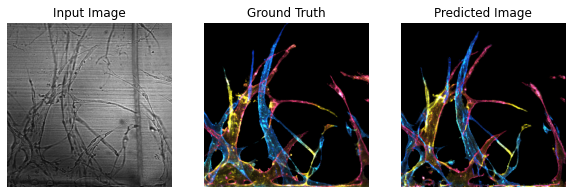

Epoch:  20
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

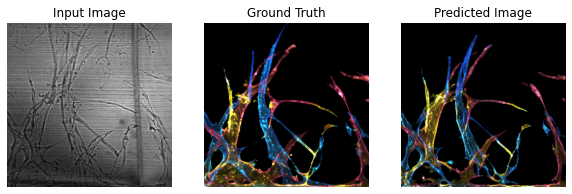

Epoch:  1


In [34]:
loss_file = os.path.join(Model_DIR, 'angio_p2p_train_loss.npz')

for k in range(50):
    print('>> curr_epoch = {}'.format(curr_epoch))
    
    # load weights
    if curr_epoch != 0:
        load_weight(curr_epoch)

    # re-training
    train_loss = fit(train_dataset, EPOCHS, test_dataset)
    
    if curr_epoch != 0:
        prev_loss = np.load(loss_file)
        gen_total_loss = np.append(prev_loss['gen_total_loss'], train_loss['gen_total_loss'])
        gen_gan_loss = np.append(prev_loss['gen_gan_loss'], train_loss['gen_gan_loss'])
        gen_l1_loss = np.append(prev_loss['gen_l1_loss'], train_loss['gen_l1_loss'])
        disc_loss = np.append(prev_loss['disc_loss'], train_loss['disc_loss'])
    else:
        gen_total_loss = np.array(train_loss['gen_total_loss'])
        gen_gan_loss = np.array(train_loss['gen_gan_loss'])
        gen_l1_loss = np.array(train_loss['gen_l1_loss'])
        disc_loss = np.array(train_loss['disc_loss'])
         
    # save training loss
    np.savez(loss_file, gen_total_loss=gen_total_loss, gen_gan_loss=gen_gan_loss, gen_l1_loss=gen_l1_loss, disc_loss=disc_loss)    
    
    # save weights
    curr_epoch += EPOCHS
    save_weight(curr_epoch)


## Plot train_loss

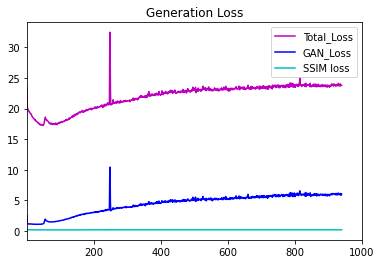

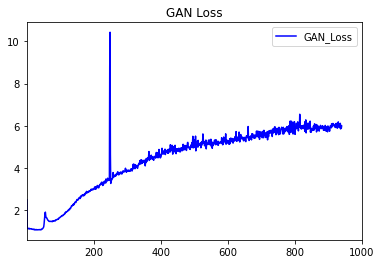

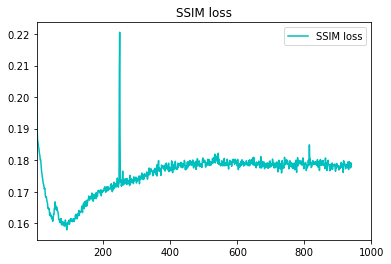

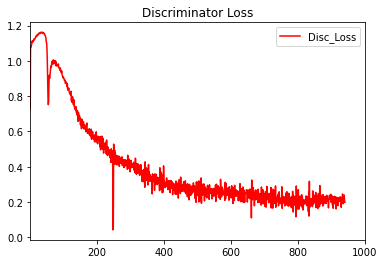

In [33]:
import matplotlib.pyplot as plt
LAMBDA = 100
loss_epoch = 1000
loss_file = os.path.join(Model_DIR, 'angio_p2p_train_loss.npz')

prev_loss = np.load(loss_file)

gen_total_loss = prev_loss['gen_total_loss']
gen_gan_loss = prev_loss['gen_gan_loss']
gen_l1_loss = prev_loss['gen_l1_loss'] 
disc_loss = prev_loss['disc_loss']

epochs = range(1, len(gen_total_loss) + 1)

plt.plot(epochs, gen_total_loss, 'm', label='Total_Loss')
plt.plot(epochs, gen_gan_loss, 'b', label='GAN_Loss')
plt.plot(epochs, gen_l1_loss, 'c', label=Loss_function)
plt.title('Generation Loss')
plt.xlim(1,loss_epoch)
# plt.ylim(0, 1)
plt.legend()
plt.savefig(Model_DIR+'\\'+'Generation_loss_epoch {}.jpg'.format(loss_epoch),dpi=300)
plt.show()


plt.plot(epochs, gen_gan_loss, 'b', label='GAN_Loss')
plt.title('GAN Loss')
plt.xlim(1,loss_epoch)
# plt.ylim(0, 1)
plt.legend()
plt.savefig(Model_DIR+'\\'+'Generation_GAN loss_epoch {}.jpg'.format(loss_epoch),dpi=300)
plt.show()

plt.plot(epochs, gen_l1_loss, 'c', label=Loss_function)
plt.title(Loss_function)
plt.xlim(1,loss_epoch)

# plt.ylim(ymin=0)
plt.legend()
plt.savefig(Model_DIR+'\\'+'Generation_{}_epoch {}.jpg'.format(Loss_function, loss_epoch),dpi=300)

plt.figure()
plt.plot(epochs, disc_loss, 'r', label='Disc_Loss')
plt.title('Discriminator Loss')
plt.xlim(1,loss_epoch)
plt.legend()
plt.savefig(Model_DIR+'\\'+'Discriminator_loss_epoch {}.jpg'.format(loss_epoch),dpi=300)
plt.show()

## Load weight & test

In [34]:
def save_images(model, test_input, tar, order):
  prediction_temp = model(test_input, training=True)
  plt.figure(figsize=(10,10))

  display_list = [test_input[0], tar[0], prediction_temp[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']
  prediction_image=[[],[],[]]
  prediction_name=[[],[],[]]
  
  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])

    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
    prediction_name[i] = '{0}\{1}.png'.format(Prediction[i+1], order)
    prediction_image[i] = np.array((display_list[i] * 0.5 + 0.5)*255.0, dtype=np.uint8)
  
    
    cv2.imwrite(prediction_name[i], prediction_image[i])
    if i == 0 :
      concat = prediction_image[i]
    if i !=0 :
      concat = np.concatenate((concat,prediction_image[i]),axis=0)
  concat_name= '{0}\{1}.png'.format(Prediction[0], order)    
  cv2.imwrite(concat_name, concat)

  
  
  

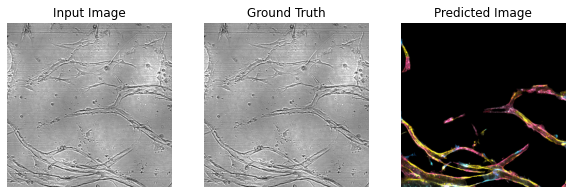

In [46]:
for example_input, example_target in test_dataset.take(1):
  save_images(generator, example_input, example_target, 1)

In [72]:
curr_epoch = 800
load_weight(curr_epoch)  # weights_gen_file = os.path.join(MODEL_DIR, 'angio_p2p_gen_epoch_{}.h5'.format(epoch))

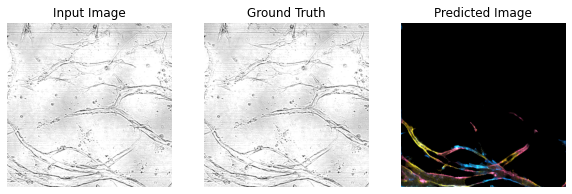

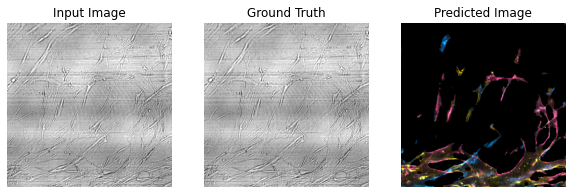

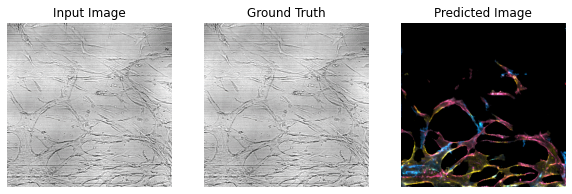

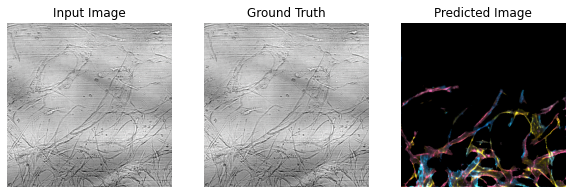

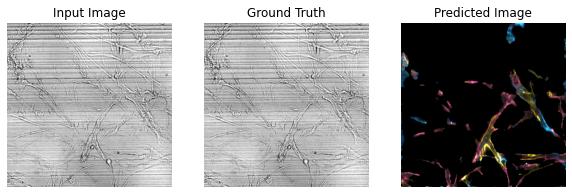

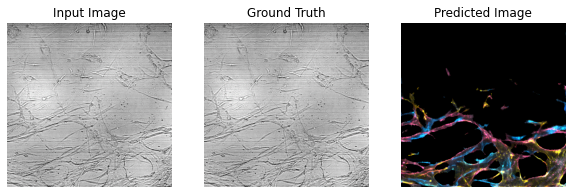

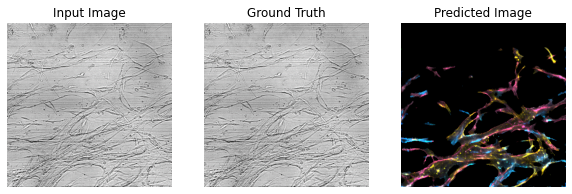

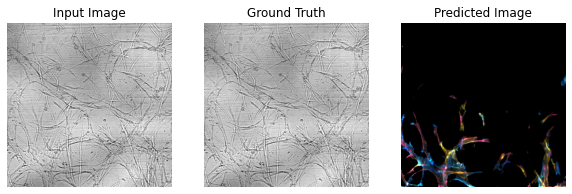

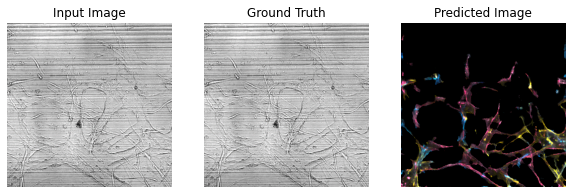

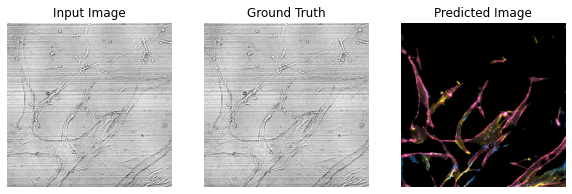

In [62]:
for i in range(len(Prediction)):
  if not os.path.exists(Prediction[i]):
      os.makedirs(Prediction[i])
    
for i, example in enumerate(test_dataset.take(10)): # Testset_number
  example_input, example_target = example
  save_images(generator, example_input, example_target,i)


###학습된 코드로 test dataset에서 가상염색된 이미지 반환

In [56]:
"""live cell 용이 아니라 학습한거 확인용"""
import cv2
### 다양한 색상의 depth color 버전
def generate_images(model, test_input, tar, file_name, concat_name, BF_name, GT_name):
    prediction = model(test_input, training=False)

    file_name = file_name
    concat_name = concat_name
    BF_name = BF_name
    GT_name = GT_name
    display_list = [test_input[0], tar[0], prediction[0]]
  
    prediction_image=[[],[],[]]

    prediction_image[0] = np.array((display_list[0] * 0.5 + 0.5)*255.0, dtype=np.uint8) 
    prediction_image[1] = np.array((display_list[1] * 0.5 + 0.5)*255.0, dtype=np.uint8) 
    prediction_image[2] = np.array((display_list[2] * 0.5 + 0.5)*255.0, dtype=np.uint8)

    virtual_staining = prediction_image[2]
    BF_img = prediction_image[0]
    GT_img = prediction_image[1]
    concat = np.concatenate((prediction_image[0],virtual_staining),axis=0)
    cv2.imwrite(file_name, virtual_staining)
    cv2.imwrite(GT_name, GT_img)
    cv2.imwrite(concat_name, concat)
    cv2.imwrite(BF_name, BF_img)


  

In [79]:
def save_images(model, test_input, tar, order, file_name, concat_name, BF_name, GT_name):
  prediction_temp = model(test_input, training=True)
  plt.figure(figsize=(10,10))

  display_list = [test_input[0], tar[0], prediction_temp[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']
  prediction_image=[[],[],[]]
  prediction_name=[[],[],[]]
  
  file_name = file_name
  concat_name = concat_name
  BF_name = BF_name
  GT_name = GT_name
    
  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])

    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
    prediction_name[i] = '{0}\{1}.png'.format(Prediction[i+1], order)
    prediction_image[i] = np.array((display_list[i] * 0.5 + 0.5)*255.0, dtype=np.uint8)
  
    
    #cv2.imwrite(prediction_name[i], prediction_image[i])
    if i == 0 :
      concat = prediction_image[i]
    if i !=0 :
      concat = np.concatenate((concat,prediction_image[i]),axis=0)

  
  virtual_staining = prediction_image[2]
  BF_img = prediction_image[0]
  GT_img = prediction_image[1]
  #concat = np.concatenate((prediction_image[0],virtual_staining),axis=0)
  cv2.imwrite(file_name, cv2.cvtColor(virtual_staining, cv2.COLOR_RGB2BGR))
  cv2.imwrite(GT_name, cv2.cvtColor(GT_img, cv2.COLOR_RGB2BGR))
  cv2.imwrite(concat_name, cv2.cvtColor(concat, cv2.COLOR_RGB2BGR))
  cv2.imwrite(BF_name, cv2.cvtColor(BF_img, cv2.COLOR_RGB2BGR))

In [74]:
test_dir = os.path.join(DATASET_DIR,'Test 240809')
test_path = os.path.join(test_dir, '*.png')
test_dataset = tf.data.Dataset.list_files(test_path, shuffle=False)
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)

In [77]:
Testset_number=390

In [80]:
### anaylsis 관련 코드 초기화 부분
Concat_DIR = os.path.join(Prediction_DIR, '0. Concat_images')
Input_DIR = os.path.join(Prediction_DIR, '1. Input_images')
Groundtruth_DIR = os.path.join(Prediction_DIR, '2. Groundtruth_images')
Pred_DIR = os.path.join(Prediction_DIR, '3. Prediction_images')  

for i, example in enumerate(test_dataset.take(Testset_number)): #Testset_number

    file_name = '{0}\{1}.png'.format(Pred_DIR, i)
    concat_file_name = '{0}\{1}.png'.format(Concat_DIR, i)
    BF_file_name = '{0}\{1}.png'.format(Input_DIR, i)
    GT_file_name = '{0}\{1}.png'.format(Groundtruth_DIR, i)

    example_input, example_target = example
    #generate_images(generator, example_input, example_target, file_name, concat_file_name, BF_file_name, GT_file_name)
    save_images(generator, example_input, example_target, i, file_name, concat_file_name, BF_file_name, GT_file_name)

c:\Users\seoul-univ\Anaconda3\envs\tf_gpu\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


%%%라이브 이미징 연결


In [ ]:
from keras.models import model_from_json 
model_gen_file = os.path.join(Model_DIR, 'angio_p2p_model_gen.json')


def load_model(json_filename):
    json_file = open(json_filename, "r")
    loaded_model_json = json_file.read() 
    json_file.close()
    
    model = model_from_json(loaded_model_json)
    return model

In [ ]:
curr_epoch = 1000
generator = load_model(model_gen_file)

In [ ]:
def load(image_file):
  image = tf.io.read_file(image_file)
  #image = tf.image.decode_jpeg(image)
  image = tf.image.decode_png(image, channels=3)
    
  h = tf.shape(image)[0]
  h = h // 2
    
  input_image = image[:h, :, :]
  real_image = image[h:, :, :]

  input_image = tf.cast(input_image, tf.float32)
  real_image = tf.cast(real_image, tf.float32)

  return input_image, real_image

def normalize(input_image, real_image):
  input_image = (input_image / 127.5) - 1
  real_image = (real_image / 127.5) - 1

  return input_image, real_image

def load_image_test(image_file):
  input_image, real_image = load(image_file)
#  input_image, real_image = resize(input_image, real_image,
#                                   IMG_HEIGHT, IMG_WIDTH)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

test_dir = os.path.join(DATASET_DIR,'Test dataset')
test_path = os.path.join(test_dir, '*.png')

test_dataset = tf.data.Dataset.list_files(test_path, shuffle=False)
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)

In [ ]:
for example_input, example_target in test_dataset.take(10):
  generate_images(generator, example_input, example_target)

In [ ]:
for example_input, example_target in test_dataset.take(1):
  generate_images(model, test_input, tar, file_name, concat_name, BF_name, GT_name)

In [ ]:
"""24.05.13 버전인데 GT가 없어서 수정 - 아마 live cell imaging 용이라 없음"""
### 다양한 색상의 depth color 버전
def generate_images(model, test_input, tar, file_name, concat_name, BF_name):
  prediction = model(test_input, training=True)

  file_name = file_name
  concat_name = concat_name
  BF_name = BF_name
  display_list = [test_input[0], tar[0], prediction[0]]
  
  title = ['Input Image', 'Ground Truth', 'Predicted Image']
  prediction_image=[[],[],[]]

  prediction_image[0] = np.array((display_list[0] * 0.5 + 0.5)*255.0, dtype=np.uint8) 
  prediction_image[2] = np.array((display_list[2] * 0.5 + 0.5)*255.0, dtype=np.uint8)
  # prediction_image[2] = prediction_image[2][:,:,1]
  # zeros = np.array(display_list[2] *0, dtype=np.uint8)
  # zeros = zeros[:,:,1]
  virtual_staining = prediction_image[2]
  BF_img = prediction_image[0]
  concat = np.concatenate((prediction_image[0],virtual_staining),axis=0)
  cv2.imwrite(file_name, virtual_staining)
  cv2.imwrite(concat_name, concat)
  cv2.imwrite(BF_name, BF_img)
  #plt.show()
  
  
  

In [ ]:
"""24.05.13 버전인데 GT가 없어서 수정 - 아마 live cell imaging 용이라 없음 + 이미지 전처리 코드 추가"""

### 다양한 색상의 depth color 버전
def generate_images(model, test_input, tar, file_name, concat_name, BF_name):
  prediction = model(test_input, training=True)
  min_area = 100
  thres_value = 20
  file_name = file_name
  concat_name = concat_name
  BF_name = BF_name
  display_list = [test_input[0], tar[0], prediction[0]]
  
  title = ['Input Image', 'Ground Truth', 'Predicted Image']
  prediction_image=[[],[],[]]

  prediction_image[0] = np.array((display_list[0] * 0.5 + 0.5)*255.0, dtype=np.uint8) 
  prediction_image[2] = np.array((display_list[2] * 0.5 + 0.5)*255.0, dtype=np.uint8)
  prediction_image[2] = img_preprocessing(prediction_image[2], min_area, thres_value)
  # prediction_image[2] = prediction_image[2][:,:,1]
  # zeros = np.array(display_list[2] *0, dtype=np.uint8)
  # zeros = zeros[:,:,1]
  virtual_staining = prediction_image[2]
  BF_img = prediction_image[0]
  concat = np.concatenate((prediction_image[0],virtual_staining),axis=0)
  cv2.imwrite(file_name, virtual_staining)
  cv2.imwrite(concat_name, concat)
  cv2.imwrite(BF_name, BF_img)
  #plt.show()
  
  
  

In [ ]:
import cv2
import numpy as np

# Load your image
image_path = '36.png'
original_image = cv2.imread(image_path)

if original_image is None:
    raise FileNotFoundError(f"Image not found at path {image_path}")

# Convert image to grayscale
gray_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)

# Step 2: Apply binary thresholding
_, binary_image = cv2.threshold(gray_image, 20, 255, cv2.THRESH_BINARY)

# Step 3: Remove small white blobs
# Set minimum area of blobs to keep
min_area = 250  # Adjust this value based on your specific needs
contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
for contour in contours:
    if cv2.contourArea(contour) < min_area:
        cv2.drawContours(binary_image, [contour], -1, (0, 0, 0), -1)

# Step 4: Apply the mask to the original image
mask = binary_image == 255  # Create a boolean mask where white regions are True
final_image = original_image.copy()
final_image[~mask] = 0  # Apply mask to the original image by zeroing out non-mask areas

# Display or save your final image
plt.imshow(final_image)
plt.show()


In [ ]:
import cv2
import numpy as np


def img_preprocessing(image, min_area, thres_value) :

    original_image = image
    min_area = min_area
    thres_value = thres_value
    if original_image is None:
        raise FileNotFoundError(f"Image not found at path {image_path}")

    # Convert image to grayscale
    gray_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)

    # Step 2: Apply binary thresholding
    _, binary_image = cv2.threshold(gray_image, thres_value, 255, cv2.THRESH_BINARY)

    # Step 3: Remove small white blobs
    # Set minimum area of blobs to keep
    min_area = min_area  # Adjust this value based on your specific needs
    contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    for contour in contours:
        if cv2.contourArea(contour) < min_area:
            cv2.drawContours(binary_image, [contour], -1, (0, 0, 0), -1)

    # Step 4: Apply the mask to the original image
    mask = binary_image == 255  # Create a boolean mask where white regions are True
    final_image = original_image.copy()
    final_image[~mask] = 0  # Apply mask to the original image by zeroing out non-mask areas

    return final_image



In [ ]:
### Green signal only 버전
def generate_images(model, test_input, tar, file_name, concat_name, BF_name):
  prediction = model(test_input, training=True)

  file_name = file_name
  concat_name = concat_name
  BF_name = BF_name
  display_list = [test_input[0], tar[0], prediction[0]]
  
  title = ['Input Image', 'Ground Truth', 'Predicted Image']
  prediction_image=[[],[],[]]

  prediction_image[0] = np.array((display_list[0] * 0.5 + 0.5)*255.0, dtype=np.uint8) 
  prediction_image[2] = np.array((display_list[2] * 0.5 + 0.5)*255.0, dtype=np.uint8)
  prediction_image[2] = prediction_image[2][:,:,1]
  
  zeros = np.array(display_list[2] *0, dtype=np.uint8)
  zeros = zeros[:,:,1]
  virtual_staining = cv2.merge([zeros,prediction_image[2],zeros])
  BF_img = prediction_image[0]
  concat = np.concatenate((prediction_image[0],virtual_staining),axis=0)
  cv2.imwrite(file_name, virtual_staining)
  cv2.imwrite(concat_name, concat)
  cv2.imwrite(BF_name, BF_img)
  #plt.show()
  

In [ ]:

### numbering 수정
from PIL import Image, ImageDraw, ImageFont
import glob
import numpy as np
import pandas as pd

num_dataset = 60
image_width = 512
font_size = 45
font = ImageFont.truetype("arial.ttf", font_size) # arial.ttf 글씨체, font_size=15


test_dir = os.path.join(DATASET_DIR,'Celloger live data')
test_dir = os.path.join(test_dir,'23.04.24 512 size dataset')
test_dir = os.path.join(test_dir,'03. Split 512')


for j in range(len(os.listdir(test_dir))) : 
    split_dir = os.path.join(test_dir,'{0}'.format(j))
    input_list = os.listdir(split_dir)
    
    split_concat_name = os.path.join(Split_Concat_DIR,'{0}'.format(j))
    if not os.path.exists(split_concat_name):
                    os.makedirs(split_concat_name)
                    
    split_BF_name = os.path.join(Split_BF_DIR,'{0}'.format(j))
    if not os.path.exists(split_BF_name):
                    os.makedirs(split_BF_name)                 
                    
    split_VS_name = os.path.join(Split_VS_DIR,'{0}'.format(j))
    
    if not os.path.exists(split_VS_name):
                    os.makedirs(split_VS_name)

    
    test_path = os.path.join(split_dir, '*.png')
    test_dataset = tf.data.Dataset.list_files(test_path, shuffle=False)
    test_dataset = test_dataset.map(load_image_test)
    test_dataset = test_dataset.batch(BATCH_SIZE)
    Testset_number = len(os.listdir(test_dir))
    
    
    ### anaylsis 관련 코드 초기화 부분
    
    for i, example in enumerate(test_dataset.take(Testset_number)):
        if i<12  :
            file_name = '{0}\{1}.png'.format(split_VS_name, i)
            concat_file_name = '{0}\{1}.png'.format(split_concat_name, i)
            BF_file_name = '{0}\{1}.png'.format(split_BF_name, i)
            
            input_name = '{0}\{1}.png'.format(split_dir,i)
            input_image = cv2.imread('{0}\{1}'.format(split_dir, input_list[i]))
            input_image = input_image[0:512,0:512]
            example_input, example_target = example
            img = generate_images(generator, example_input, example_target,file_name, concat_file_name, BF_file_name)
            

            
        elif i == 12 :
            file_name = '{0}\{1}.png'.format(split_VS_name, i)
            concat_file_name = '{0}\{1}.png'.format(split_concat_name, i)
            BF_file_name = '{0}\{1}.png'.format(split_BF_name, i)
            
            input_name = '{0}\{1}.png'.format(split_dir,i)
            input_image = cv2.imread('{0}\{1}'.format(split_dir, input_list[i]))
            input_image = input_image[0:512,0:512]
            example_input, example_target = example
            img = generate_images(generator, example_input, example_target,file_name, concat_file_name, BF_file_name)
            
        elif i>12 and i <23 :
            file_name = '{0}\{1}.png'.format(split_VS_name, i)
            concat_file_name = '{0}\{1}.png'.format(split_concat_name, i)
            BF_file_name = '{0}\{1}.png'.format(split_BF_name, i)
            
            input_name = '{0}\{1}.png'.format(split_dir,i)
            input_image = cv2.imread('{0}\{1}'.format(split_dir, input_list[i]))
            input_image = input_image[0:512,0:512]
            example_input, example_target = example
            img = generate_images(generator, example_input, example_target,file_name, concat_file_name, BF_file_name)
            
        elif i == 23 :
            file_name = '{0}\{1}.png'.format(split_VS_name, i)
            concat_file_name = '{0}\{1}.png'.format(split_concat_name, i)
            BF_file_name = '{0}\{1}.png'.format(split_BF_name, i)
            
            input_name = '{0}\{1}.png'.format(split_dir,i)
            input_image = cv2.imread('{0}\{1}'.format(split_dir, input_list[i]))
            input_image = input_image[0:512,0:512]
            example_input, example_target = example
            img = generate_images(generator, example_input, example_target,file_name, concat_file_name, BF_file_name)
            
        elif i> 23 and i <34 :
            file_name = '{0}\{1}.png'.format(split_VS_name, i)
            concat_file_name = '{0}\{1}.png'.format(split_concat_name, i)
            BF_file_name = '{0}\{1}.png'.format(split_BF_name, i)
            
            input_name = '{0}\{1}.png'.format(split_dir,i)
            input_image = cv2.imread('{0}\{1}'.format(split_dir, input_list[i]))
            input_image = input_image[0:512,0:512]
            example_input, example_target = example
            img = generate_images(generator, example_input, example_target,file_name, concat_file_name, BF_file_name)
            
        elif i == 34 :
            file_name = '{0}\{1}.png'.format(split_VS_name, i)
            concat_file_name = '{0}\{1}.png'.format(split_concat_name, i)
            BF_file_name = '{0}\{1}.png'.format(split_BF_name, i)
            
            input_name = '{0}\{1}.png'.format(split_dir,i)
            input_image = cv2.imread('{0}\{1}'.format(split_dir, input_list[i]))
            input_image = input_image[0:512,0:512]
            example_input, example_target = example
            img = generate_images(generator, example_input, example_target,file_name, concat_file_name, BF_file_name)
            
        elif i> 34 and i <45 :
            file_name = '{0}\{1}.png'.format(split_VS_name, i)
            concat_file_name = '{0}\{1}.png'.format(split_concat_name, i)
            BF_file_name = '{0}\{1}.png'.format(split_BF_name, i)
            
            input_name = '{0}\{1}.png'.format(split_dir,i)
            input_image = cv2.imread('{0}\{1}'.format(split_dir, input_list[i]))
            input_image = input_image[0:512,0:512]
            example_input, example_target = example
            img = generate_images(generator, example_input, example_target,file_name, concat_file_name, BF_file_name)
            
        elif i == 45 :
            file_name = '{0}\{1}.png'.format(split_VS_name, i)
            concat_file_name = '{0}\{1}.png'.format(split_concat_name, i)
            BF_file_name = '{0}\{1}.png'.format(split_BF_name, i)
            
            input_name = '{0}\{1}.png'.format(split_dir,i)
            input_image = cv2.imread('{0}\{1}'.format(split_dir, input_list[i]))
            input_image = input_image[0:512,0:512]
            example_input, example_target = example
            img = generate_images(generator, example_input, example_target,file_name, concat_file_name, BF_file_name)
            
        elif i == 46 :
            file_name = '{0}\{1}.png'.format(split_VS_name, i)
            concat_file_name = '{0}\{1}.png'.format(split_concat_name, i)
            BF_file_name = '{0}\{1}.png'.format(split_BF_name, i)
            
            input_name = '{0}\{1}.png'.format(split_dir,i)
            input_image = cv2.imread('{0}\{1}'.format(split_dir, input_list[i]))
            input_image = input_image[0:512,0:512]
            example_input, example_target = example
            img = generate_images(generator, example_input, example_target,file_name, concat_file_name, BF_file_name)
            
        elif i> 46 :
            file_name = '{0}\{1}.png'.format(split_VS_name, i)
            concat_file_name = '{0}\{1}.png'.format(split_concat_name, i)
            BF_file_name = '{0}\{1}.png'.format(split_BF_name, i)
            
            input_name = '{0}\{1}.png'.format(split_dir,i)
            input_image = cv2.imread('{0}\{1}'.format(split_dir, input_list[i]))
            input_image = input_image[0:512,0:512]
            example_input, example_target = example
            img = generate_images(generator, example_input, example_target,file_name, concat_file_name, BF_file_name)
            
        
        print(i)   

    frames = []
    
    imgs = sorted(glob.glob("{0}\*.png".format(split_concat_name)),key=os.path.getmtime)

    tt = 0
    for k in imgs:
        new_frame = Image.open(k)
        # new_frame = new_frame.resize((256,512))
        draw=ImageDraw.Draw(new_frame)
        
        draw.text((15, image_width + 15),"t = {0} h".format(tt), fill=(255,255,255), font = font)

        frames.append(new_frame)
        tt += 1
    
    # Save into a GIF file that loops forever
    frames[0].save('{0}\{1}.gif'.format(GIF_DIR,j), format='GIF',
                append_images=frames[1:],
                save_all=True,
                duration=300, loop=0)  
    


In [ ]:
Split_Concat_DIR

In [ ]:
new_frame

In [ ]:
### numbering 수정
from PIL import Image, ImageDraw, ImageFont
import glob
import numpy as np
import pandas as pd
import natsort

image_width = 512
font_size = 45
font = ImageFont.truetype("arial.ttf", font_size)

for j in range(126)  :
    concat_name = os.path.join(Split_Concat_DIR,'{0}'.format(j))
    frames = []
    imgs = glob.glob("{0}\*.png".format(concat_name))
    imgs = natsort.natsorted(imgs)

    tt = 0
    for k in imgs:
        new_frame = Image.open(k)
        # new_frame = new_frame.resize((256,512))
        draw=ImageDraw.Draw(new_frame)
        
        draw.text((15, image_width + 15),"t = {0} h".format(tt), fill=(255,255,255), font = font)

        frames.append(new_frame)
        tt += 1

    # Save into a GIF file that loops forever
    frames[0].save('{0}\{1}.gif'.format(GIF_DIR,j), format='GIF',
                append_images=frames[1:],
                save_all=True,
                duration=300, loop=0)  

    frames_skel = []
    tt = 0
